In [1]:
%matplotlib inline

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import os
from tqdm.auto import tqdm
import shutil
import random
import xml.etree.ElementTree as ET
from xml.dom import minidom
from pathlib import Path
import glob


import torch
import torchvision

from torch.utils.data import DataLoader
from torchvision import transforms, models, datasets, utils
from tqdm import tqdm

from sklearn.model_selection import train_test_split
import json

import torch.nn as nn
import torch.nn.functional as F

import torch.optim as optim
import sklearn.metrics as met
import scipy.io

random.seed(42)

In [6]:
%cd Documentos/computer_vision/project

/home/misael/Documentos/computer_vision/project


In [7]:
# access the yolov5 folder and show the model's architecture
%cat yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [8]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [9]:
%cat yolov5/data_objects.yaml


train: ../datasets/objects/train/images
val: ../datasets/objects/valid/images
test: ../datasets/objects/test/images

# Number of Classes
nc: 2

# Class Names
names: ['plate','face']

In [10]:
%cat yolov5/models/custom_yolov5s.yaml


# parameters
nc: 2  # number of classes 
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[

In [11]:
# check if we're using torch with GPU
print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.12.0.dev20220512+cu116 _CudaDeviceProperties(name='NVIDIA GeForce RTX 3050 Ti Laptop GPU', major=8, minor=6, total_memory=3,910MB, multi_processor_count=20)


In [12]:
!python3 yolov5/detect.py --weights yolov5/runs/train/yolov5s_results3/weights/best.pt --img 640 --conf 0.5 --source datasets/objects/valid/images

detect: weights=['yolov5/runs/train/yolov5s_results3/weights/best.pt'], source=datasets/objects/valid/images, data=yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-253-g75bbaa8 Python-3.8.10 torch-1.12.0.dev20220512+cu116 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 3911MiB)

Fusing layers... 
custom_YOLOv5s summary: 232 layers, 7249215 parameters, 0 gradients, 16.8 GFLOPs
image 1/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/0_Parade_Parade_0_745.jpg: 640x640 1 face, Done. (0.009s)
image 2/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/0_Parade_Parade_0_928.jpg: 640

image 45/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/13_Interview_Interview_Sequences_13_185.jpg: 640x640 1 face, Done. (0.009s)
image 46/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/13_Interview_Interview_Sequences_13_332.jpg: 640x640 Done. (0.009s)
image 47/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/13_Interview_Interview_Sequences_13_467.jpg: 640x640 1 face, Done. (0.011s)
image 48/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/13_Interview_Interview_Sequences_13_492.jpg: 640x640 1 face, Done. (0.012s)
image 49/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/13_Interview_Interview_Sequences_13_626.jpg: 640x640 Done. (0.015s)
image 50/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/13_Interview_Interview_Sequences_13_63.jpg: 640x640 1 face, Done. (0.013s)
image 51/506 /h

image 97/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/21_Festival_Festival_21_737.jpg: 640x640 Done. (0.012s)
image 98/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/21_Festival_Festival_21_792.jpg: 640x640 1 face, Done. (0.008s)
image 99/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/22_Picnic_Picnic_22_376.jpg: 640x640 1 face, Done. (0.010s)
image 100/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/22_Picnic_Picnic_22_763.jpg: 640x640 1 face, Done. (0.014s)
image 101/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/22_Picnic_Picnic_22_940.jpg: 640x640 1 face, Done. (0.014s)
image 102/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/23_Shoppers_Shoppers_23_1035.jpg: 640x640 1 face, Done. (0.011s)
image 103/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/i

image 149/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/29_Students_Schoolkids_Students_Schoolkids_29_702.jpg: 640x640 1 face, Done. (0.012s)
image 150/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/29_Students_Schoolkids_Students_Schoolkids_29_720.jpg: 640x640 1 face, Done. (0.009s)
image 151/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/29_Students_Schoolkids_Students_Schoolkids_29_831.jpg: 640x640 1 face, Done. (0.011s)
image 152/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/2_Demonstration_Demonstration_Or_Protest_2_742.jpg: 640x640 1 face, Done. (0.010s)
image 153/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/2_Demonstration_Demonstration_Or_Protest_2_890.jpg: 640x640 1 face, Done. (0.009s)
image 154/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/2_Demonstration_Politica

image 201/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/35_Basketball_basketballgame_ball_35_294.jpg: 640x640 1 face, Done. (0.009s)
image 202/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/35_Basketball_basketballgame_ball_35_447.jpg: 640x640 1 face, Done. (0.009s)
image 203/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/35_Basketball_basketballgame_ball_35_56.jpg: 640x640 1 face, Done. (0.008s)
image 204/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/35_Basketball_basketballgame_ball_35_587.jpg: 640x640 1 face, Done. (0.012s)
image 205/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/35_Basketball_playingbasketball_35_34.jpg: 640x640 1 face, Done. (0.009s)
image 206/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/35_Basketball_playingbasketball_35_396.jpg: 640x640 1 face, Done. (

image 253/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/41_Swimming_Swimmer_41_261.jpg: 640x640 1 face, Done. (0.013s)
image 254/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/41_Swimming_Swimmer_41_339.jpg: 640x640 1 face, Done. (0.016s)
image 255/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/41_Swimming_Swimmer_41_391.jpg: 640x640 1 face, Done. (0.014s)
image 256/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/41_Swimming_Swimmer_41_402.jpg: 640x640 1 face, Done. (0.013s)
image 257/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/41_Swimming_Swimmer_41_406.jpg: 640x640 1 face, Done. (0.016s)
image 258/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/41_Swimming_Swimmer_41_453.jpg: 640x640 Done. (0.012s)
image 259/506 /home/misael/Documentos/computer_vision/project/datasets/objects

image 308/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/47_Matador_Bullfighter_Matador_Bullfighter_47_788.jpg: 640x640 1 face, Done. (0.008s)
image 309/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/47_Matador_Bullfighter_Matador_Bullfighter_47_891.jpg: 640x640 1 face, Done. (0.008s)
image 310/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/47_Matador_Bullfighter_matadorbullfighting_47_624.jpg: 640x640 1 face, Done. (0.008s)
image 311/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/47_Matador_Bullfighter_matadorbullfighting_47_664.jpg: 640x640 1 face, Done. (0.012s)
image 312/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/47_Matador_Bullfighter_matadorbullfighting_47_729.jpg: 640x640 1 face, Done. (0.009s)
image 313/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/47_Matador_Bullfig

image 357/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/54_Rescue_firemanrescue_54_315.jpg: 640x640 1 face, Done. (0.015s)
image 358/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/54_Rescue_firemanrescue_54_329.jpg: 640x640 2 faces, Done. (0.010s)
image 359/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/54_Rescue_firemanrescue_54_407.jpg: 640x640 1 face, Done. (0.009s)
image 360/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/54_Rescue_firemanrescue_54_511.jpg: 640x640 1 face, Done. (0.011s)
image 361/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/54_Rescue_firemanrescue_54_565.jpg: 640x640 1 face, Done. (0.009s)
image 362/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/54_Rescue_firemanrescue_54_613.jpg: 640x640 1 face, Done. (0.015s)
image 363/506 /home/misael/Documentos/compute

image 409/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/5_Car_Accident_Car_Crash_5_52.jpg: 640x640 1 plate, 1 face, Done. (0.012s)
image 410/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/5_Car_Accident_Car_Crash_5_531.jpg: 640x640 1 plate, 1 face, Done. (0.012s)
image 411/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/61_Street_Battle_streetfight_61_570.jpg: 640x640 1 face, Done. (0.012s)
image 412/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/61_Street_Battle_streetfight_61_657.jpg: 640x640 1 face, Done. (0.008s)
image 413/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/61_Street_Battle_streetfight_61_724.jpg: 640x640 1 face, Done. (0.008s)
image 414/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/6_Funeral_Funeral_6_1008.jpg: 640x640 1 face, Done. (0.011s)
image 415/506 /home/

image 459/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/Cars120.png: 640x640 1 plate, Done. (0.011s)
image 460/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/Cars121.png: 640x640 1 plate, Done. (0.011s)
image 461/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/Cars154.png: 640x640 1 plate, Done. (0.008s)
image 462/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/Cars168.png: 640x640 1 plate, Done. (0.014s)
image 463/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/Cars177.png: 640x640 1 plate, Done. (0.012s)
image 464/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/Cars180.png: 640x640 1 plate, Done. (0.009s)
image 465/506 /home/misael/Documentos/computer_vision/project/datasets/objects/valid/images/Cars182.png: 640x640 1 plate, Done. (0.012s)
image 466/506 /home/misael/Documentos/com

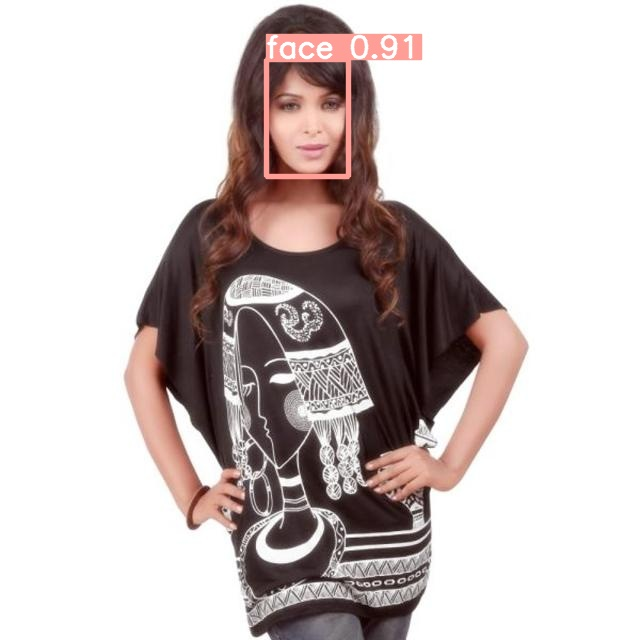

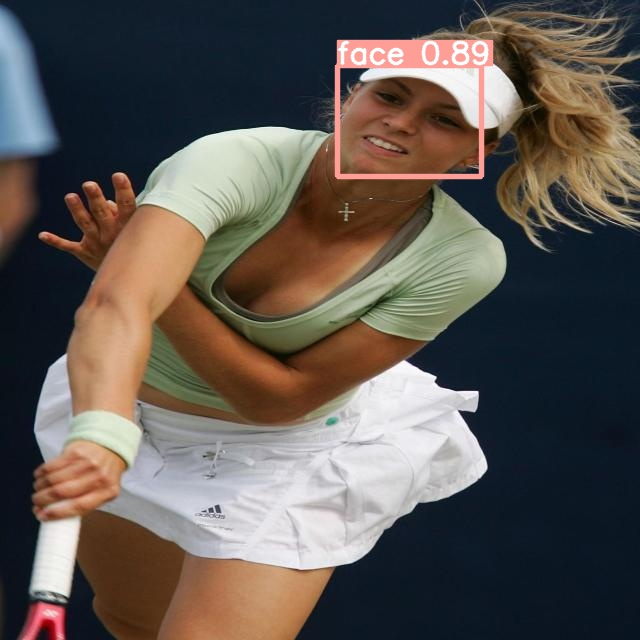

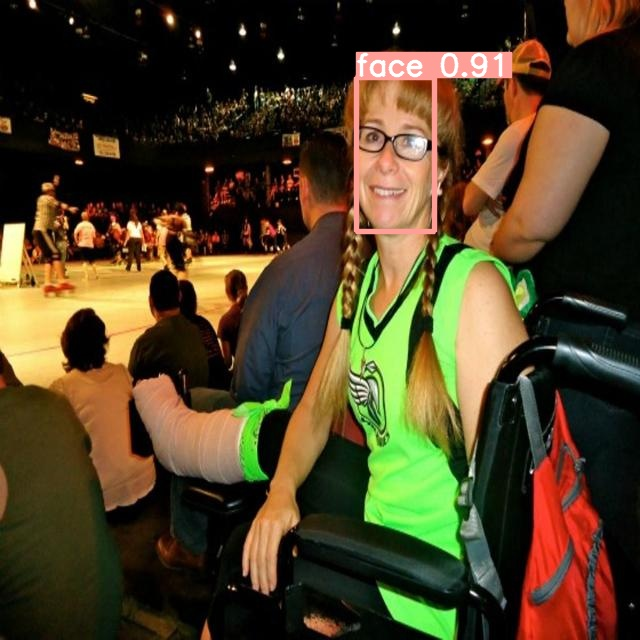

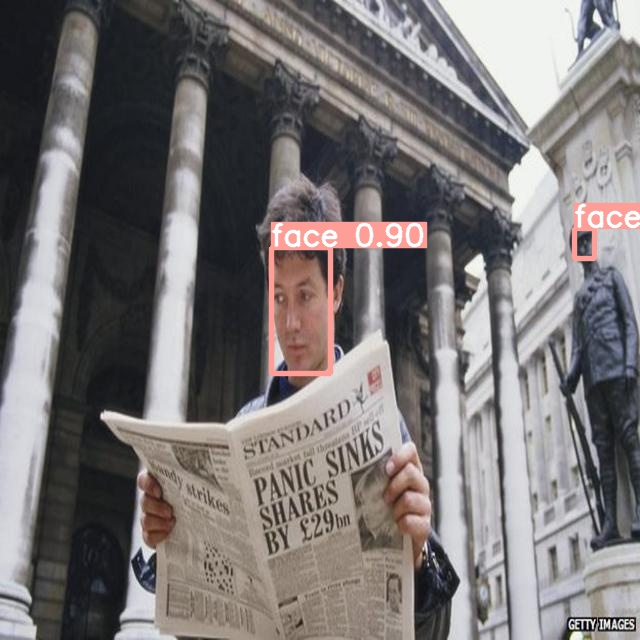

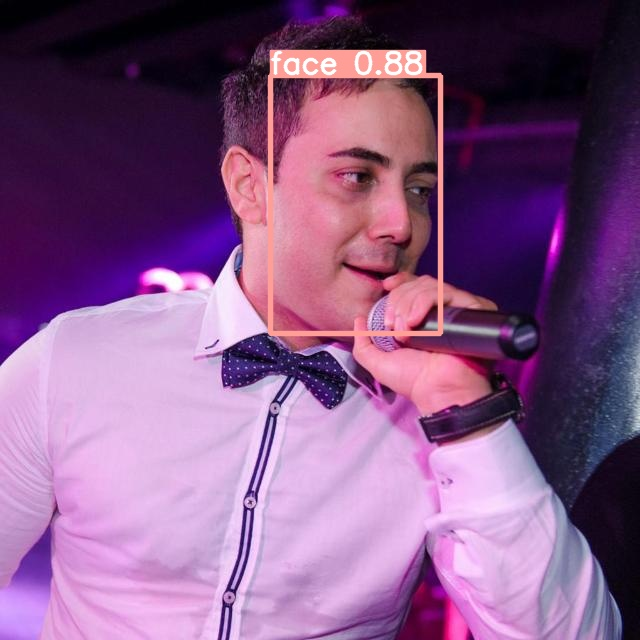

...

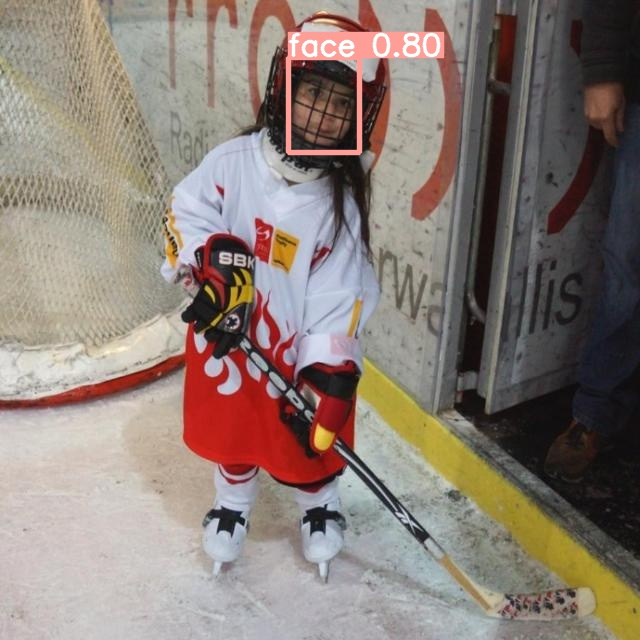

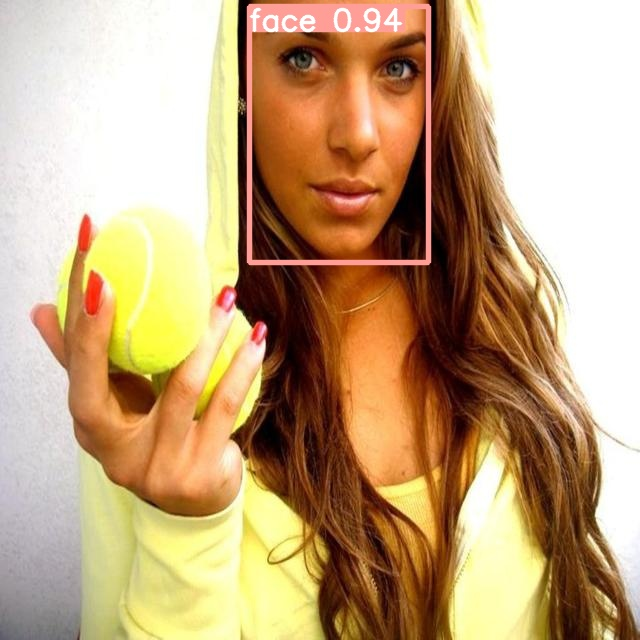

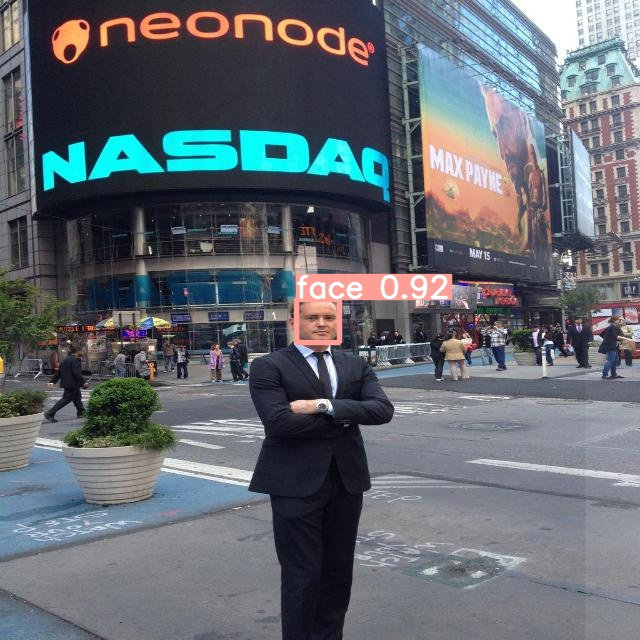

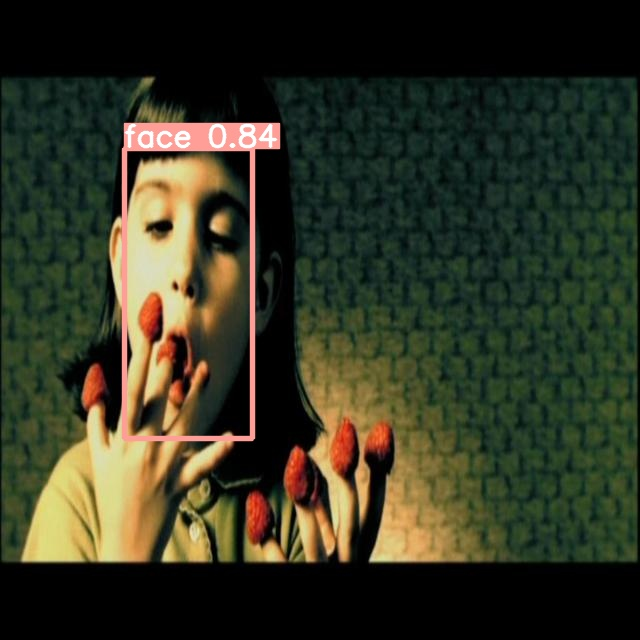

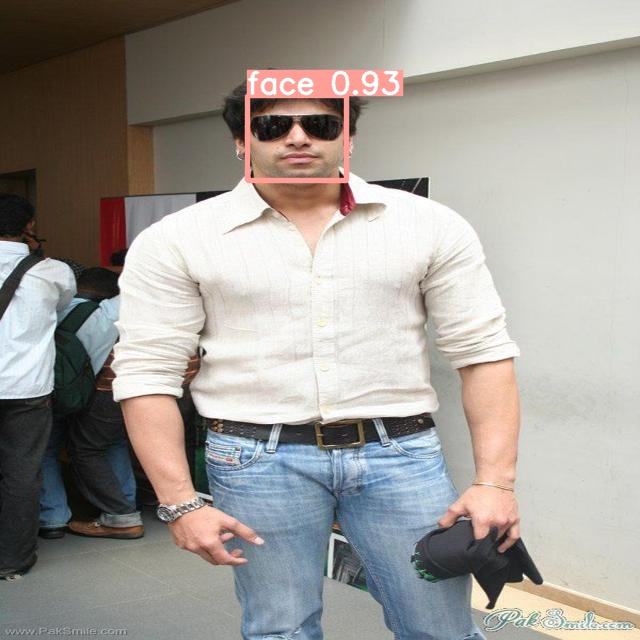

In [13]:
import glob
from IPython.display import Image, display

for image in glob.glob('yolov5/runs/detect/exp4/*.jpg')[:15]:
    display(Image(filename=image))
    print("\n")

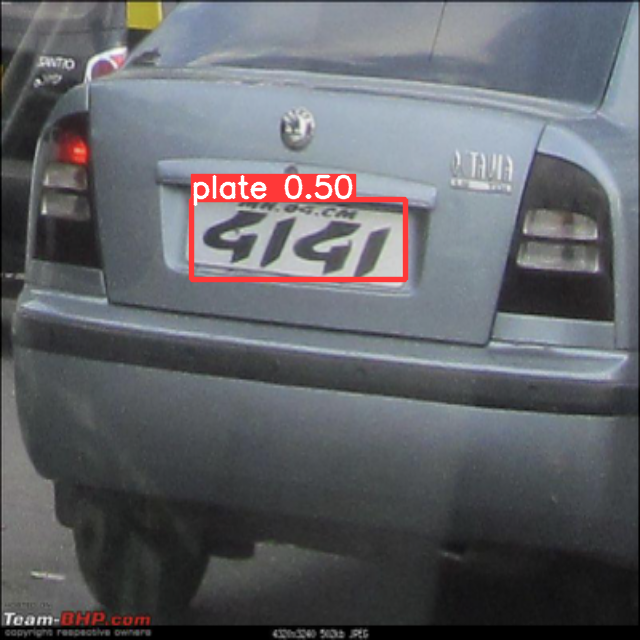

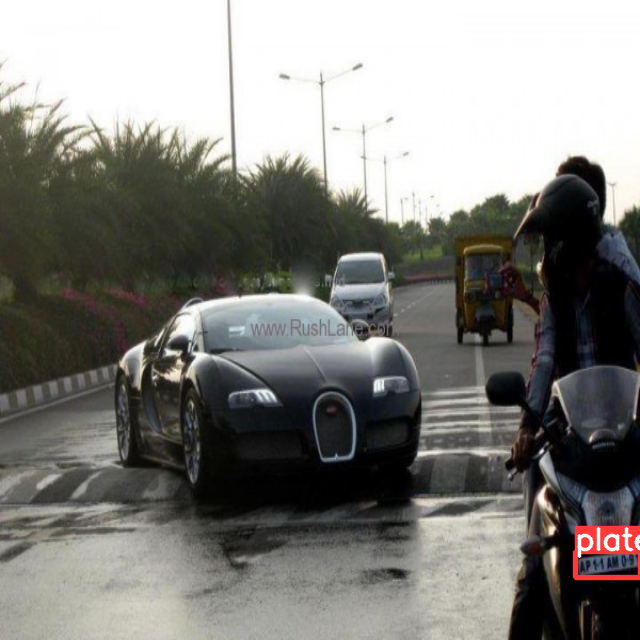

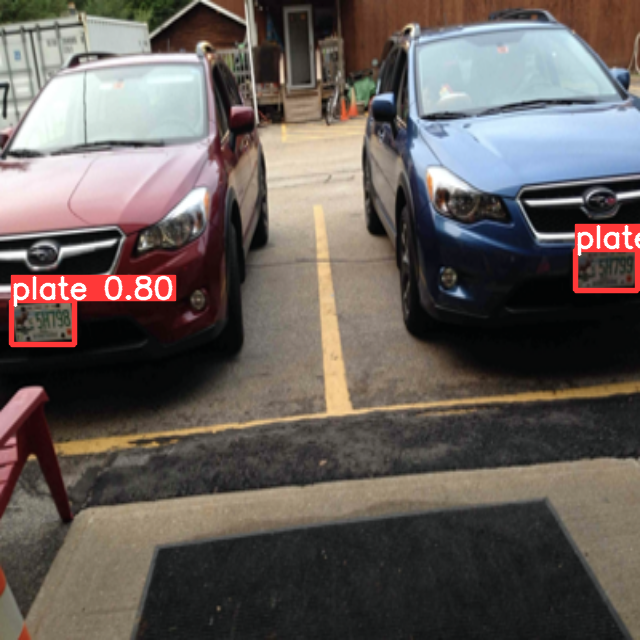

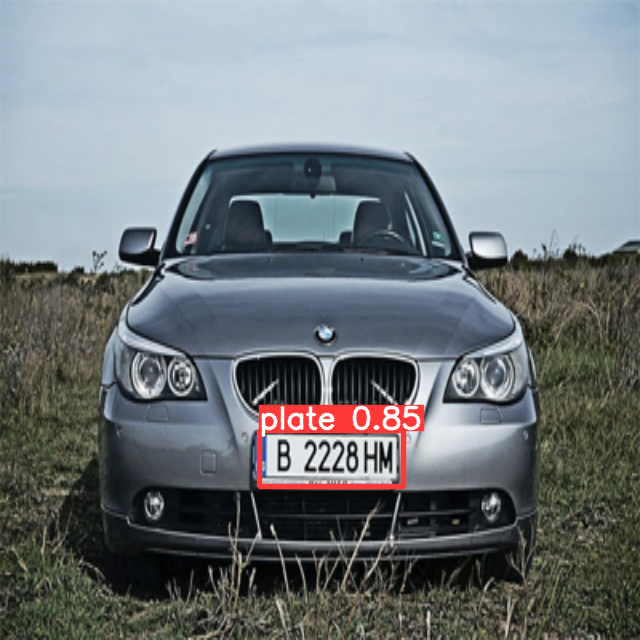

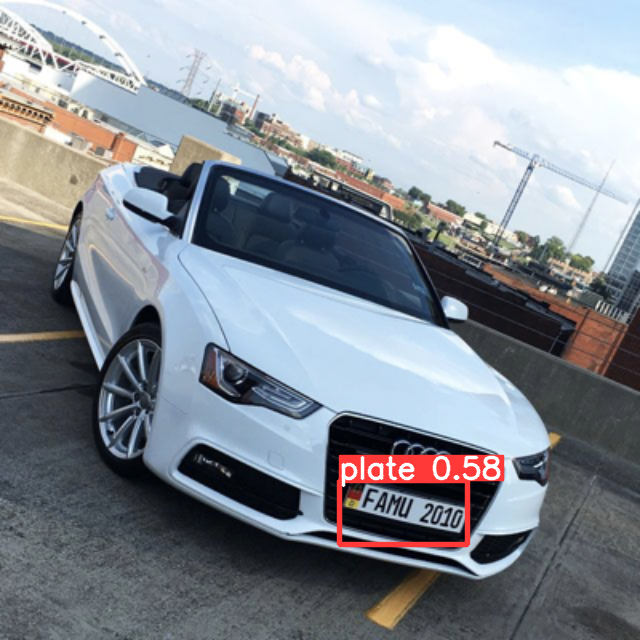

...

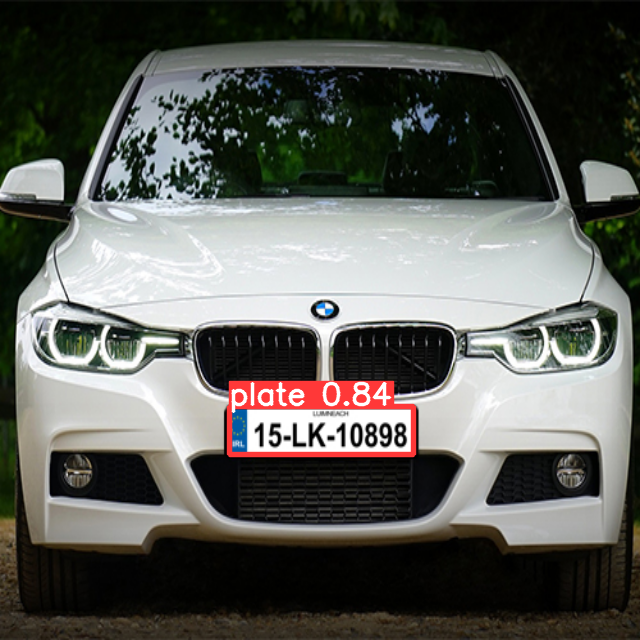

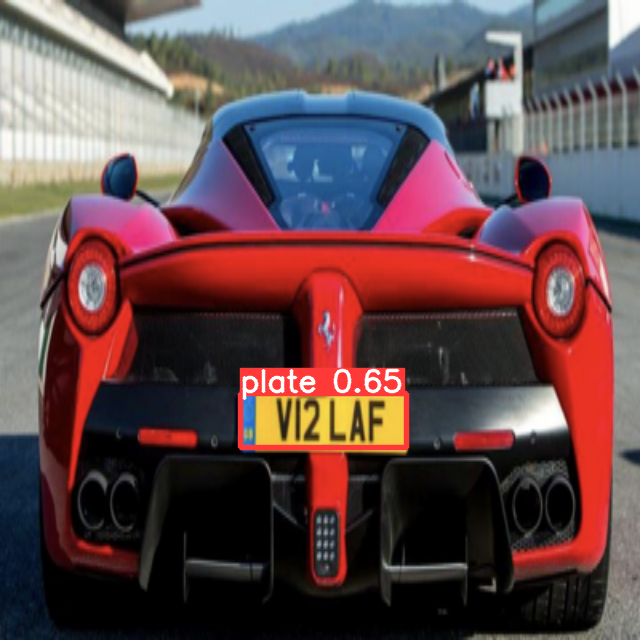

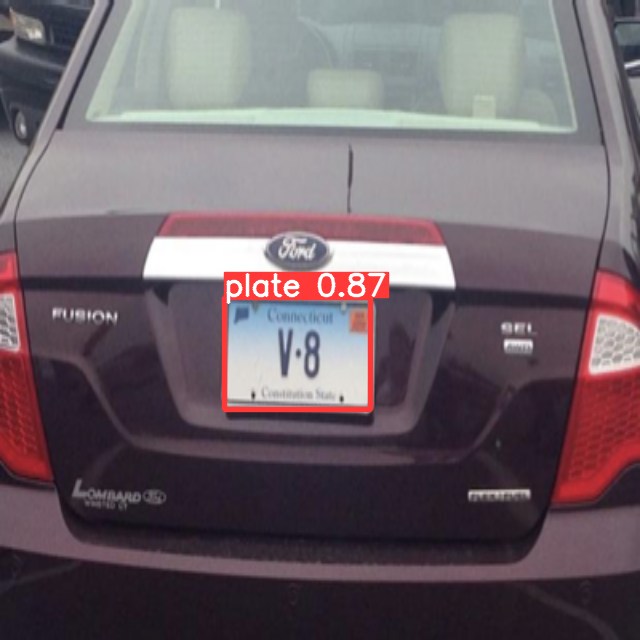

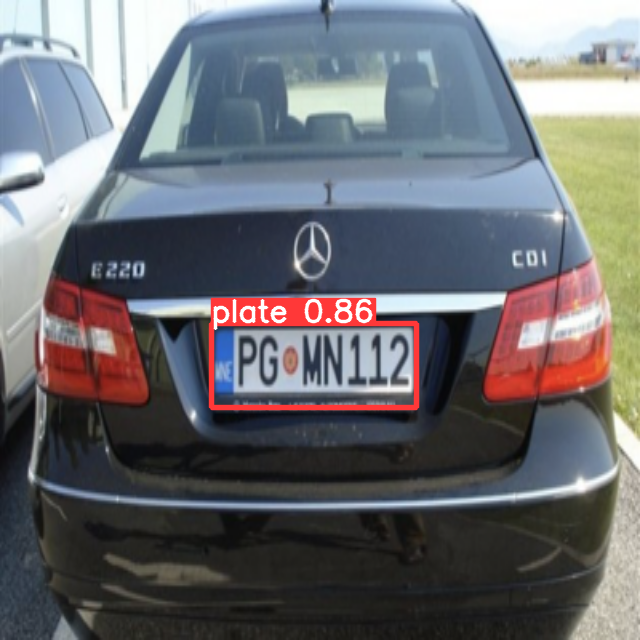

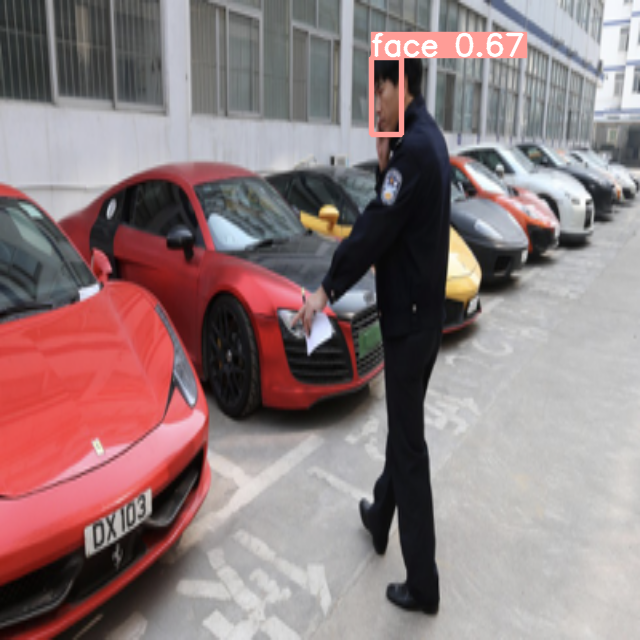

In [14]:
import glob
from IPython.display import Image, display

for image in glob.glob('yolov5/runs/detect/exp4/*.png')[:15]:
    display(Image(filename=image))
    print("\n")